Test allignment between ALHIC2416 and ALHIC2401

Currently crude - just average at each depth

In [1]:
#%% Import packages 

# general
import numpy as np
import pandas as pd

# plotting
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# my functions/classes
import sys
sys.path.append("../core_scripts/")
from ECMclass import ECM

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
# smoothing window, mm
window = 10

# paths
path_to_data = '../../data/'
path_to_figures = '../../../figures/cul_de_sac/'
metadata_file = 'metadata.csv'

In [3]:
#%% Read in metadata and import data

meta = pd.read_csv(path_to_data+metadata_file)

# import each script as an ECM class item
data = []
cores = []
sections = []
faces = []
ACorDCs = []
for index,row in meta.iterrows():
    
    core = row['core']
    section = row['section']
    face = row['face']
    ACorDC = row['ACorDC']
    
    if core == 'alhic2401' or core == 'alhic2416':
        
        print("Reading "+core+", section "+section+'-'+face+'-'+ACorDC)
    
        data_item = ECM(core,section,face,ACorDC)
        data_item.rem_ends(30)
        #data_item.smooth(window)
        #data_item.norm_all()
        #data_item.norm_outside()
        data.append(data_item)
        
        cores.append(core)
        sections.append(section)
        faces.append(face)
        ACorDCs.append(ACorDC)

sec = set(sections)

Reading alhic2401, section 1-w1-AC
Reading alhic2401, section 1-w1-AC
Reading alhic2401, section 1-w1-DC
Reading alhic2401, section 1-w2-AC
Reading alhic2401, section 1-w2-DC
Reading alhic2401, section 10-w1-AC
Reading alhic2401, section 10-w1-DC
Reading alhic2401, section 10-w2-AC
Reading alhic2401, section 10-w2-DC
Reading alhic2401, section 13-w1-AC
Reading alhic2401, section 13-w1-DC
Reading alhic2401, section 13-w2-AC
Reading alhic2401, section 13-w2-DC
Reading alhic2401, section 14-w1-AC
Reading alhic2401, section 14-w1-DC
Reading alhic2401, section 14-w2-AC
Reading alhic2401, section 14-w2-DC
Reading alhic2401, section 15-w1-AC
Reading alhic2401, section 15-w1-DC
Reading alhic2401, section 15-w2-AC
Reading alhic2401, section 15-w2-DC
Reading alhic2401, section 16-w1-AC
Reading alhic2401, section 16-w1-DC
Reading alhic2401, section 16-w2-AC
Reading alhic2401, section 16-w2-DC
Reading alhic2401, section 17-w1-AC
Reading alhic2401, section 17-w1-DC
Reading alhic2401, section 17-w2-

In [4]:
depth_alhic2401_AC = []
depth_alhic2401_DC = []
meas_ALHIC2401_AC = []
meas_ALHIC2401_DC = []

depth_alhic2416_AC = []
depth_alhic2416_DC = []
meas_ALHIC2416_AC = []
meas_ALHIC2416_DC = []


for d in data:
    button_idx = d.button == 0
    depth = d.depth[button_idx].tolist()
    meas = d.meas[button_idx].tolist()

    if d.core == 'alhic2401':
        print("Running core "+d.core+" section "+d.section)
        if d.ACorDC == 'AC':
            for i in range(len(depth)):
                depth_alhic2401_AC.append(depth[i])
                meas_ALHIC2401_AC.append(meas[i])
        else:
            for i in range(len(depth)):
                depth_alhic2401_DC.append(depth[i])
                meas_ALHIC2401_DC.append(meas[i])
    elif d.core == 'alhic2416':
        if d.ACorDC == 'AC':
            for i in range(len(depth)):
                depth_alhic2416_AC.append(depth[i])
                meas_ALHIC2416_AC.append(meas[i])
        else:
            for i in range(len(depth)):
                depth_alhic2416_DC.append(depth[i])
                meas_ALHIC2416_DC.append(meas[i])
    else:
        print("Error: Invalid core")



Running core alhic2401 section 1
Running core alhic2401 section 1
Running core alhic2401 section 1
Running core alhic2401 section 1
Running core alhic2401 section 1
Running core alhic2401 section 10
Running core alhic2401 section 10
Running core alhic2401 section 10
Running core alhic2401 section 10
Running core alhic2401 section 13
Running core alhic2401 section 13
Running core alhic2401 section 13
Running core alhic2401 section 13
Running core alhic2401 section 14
Running core alhic2401 section 14
Running core alhic2401 section 14
Running core alhic2401 section 14
Running core alhic2401 section 15
Running core alhic2401 section 15
Running core alhic2401 section 15
Running core alhic2401 section 15
Running core alhic2401 section 16
Running core alhic2401 section 16
Running core alhic2401 section 16
Running core alhic2401 section 16
Running core alhic2401 section 17
Running core alhic2401 section 17
Running core alhic2401 section 17
Running core alhic2401 section 17
Running core alhic2

In [5]:
def get_ave(depth,meas):

    min_depth = round(min(depth),2)
    max_depth = round(max(depth),2)
    d = np.linspace(min_depth,max_depth,int((max_depth-min_depth)*100+1))

    # sort depth and meas
    depth, meas = zip(*sorted(zip(depth, meas)))
    

    m = []
    lo = 0
    hi = 0
    for i in range(len(d)):

        lo = hi

        while hi<len(depth) and depth[hi] < d[i] + 0.005:
            hi += 1

        # get average of the measurements of elements in the list with index between lo and hi-1
        m.append(np.median(meas[lo:hi-1]))


    return d,m

In [6]:
# compute averages
DC_d_2401,DC_m_2401 = get_ave(depth_alhic2401_DC,meas_ALHIC2401_DC)
AC_d_2401,AC_m_2401 = get_ave(depth_alhic2401_AC,meas_ALHIC2401_AC)
DC_d_2416,DC_m_2416 = get_ave(depth_alhic2416_DC,meas_ALHIC2416_DC)
AC_d_2416,AC_m_2416 = get_ave(depth_alhic2416_AC,meas_ALHIC2416_AC)

/Users/Liam/anaconda3/envs/ecm/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/Liam/anaconda3/envs/ecm/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


/var/folders/b3/ghp5pyzj7_x9mhrs3x202bm80000gn/T/ipykernel_94781/2294416016.py:55: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  a.set_xlim([0, 4*10**-6])


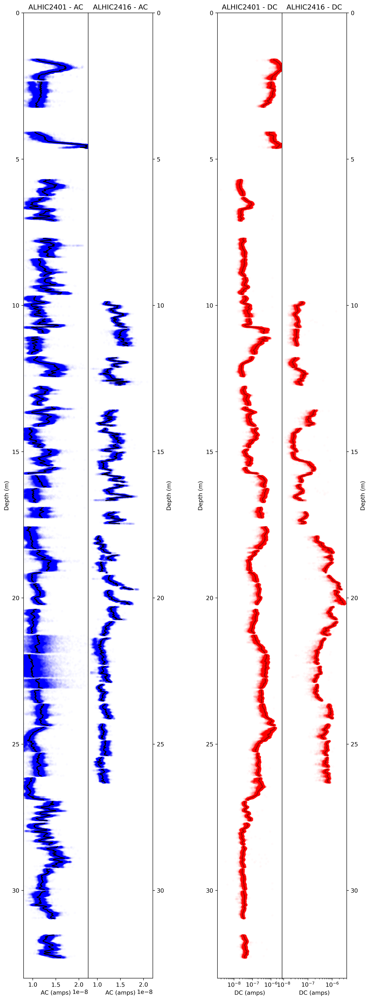

In [7]:
fig, ax = plt.subplots(1, 5, figsize=(10, 30), dpi=300)

# turn off axis 2
ax[2].axis('off')

# make axis 1 and 5 have y axis on the right
ax[1].yaxis.tick_right()
ax[4].yaxis.tick_right()
ax[1].yaxis.set_label_position("right")
ax[4].yaxis.set_label_position("right")

for a in [ax[0],ax[1],ax[3],ax[4]]:
    a.set_ylabel('Depth (m)')
    a.set_ylim([33,0])

# eliminate horizontal space between subplots 0,1 and 3,4
fig.subplots_adjust(wspace=0)



# plot all AC data on left
ax[0].plot(meas_ALHIC2401_AC, depth_alhic2401_AC, '.', alpha=0.01,color='blue')
ax[1].plot(meas_ALHIC2416_AC, depth_alhic2416_AC, '.', alpha = 0.01, color='blue')

# plot AC on left (2401 on ax 0 and 2416 on ax 1)
ax[0].plot(AC_m_2401, AC_d_2401, color='k', label='AC')
ax[1].plot(AC_m_2416, AC_d_2416, color='k', label='AC')

# plot DC on right (2401 on ax 3 and 2416 on ax 4)
ax[3].plot(DC_m_2401, DC_d_2401, color='k', label='DC')
ax[4].plot(DC_m_2416, DC_d_2416, color='k', label='DC')

# plot all DC data on right
ax[3].plot(meas_ALHIC2401_DC, depth_alhic2401_DC, '.', alpha=0.01, color='red')
ax[4].plot(meas_ALHIC2416_DC, depth_alhic2416_DC, '.', alpha=0.01, color='red')

# add subplot titles
ax[0].set_title('ALHIC2401 - AC')
ax[1].set_title('ALHIC2416 - AC')
ax[3].set_title('ALHIC2401 - DC')
ax[4].set_title('ALHIC2416 - DC')

# put DC on log scale
ax[3].set_xscale('log')
ax[4].set_xscale('log')

# add x axis labels
ax[0].set_xlabel('AC (amps)')
ax[1].set_xlabel('AC (amps)')
ax[3].set_xlabel('DC (amps)')
ax[4].set_xlabel('DC (amps)')

# set common x axis limits for 0,1 and 3,4
for a in [ax[3],ax[4]]:
    a.set_xlim([0, 4*10**-6])
for a in [ax[0],ax[1]]:
    a.set_xlim([0.8*10**-8, 2.2*10**-8])


(0.0, 4e-06)

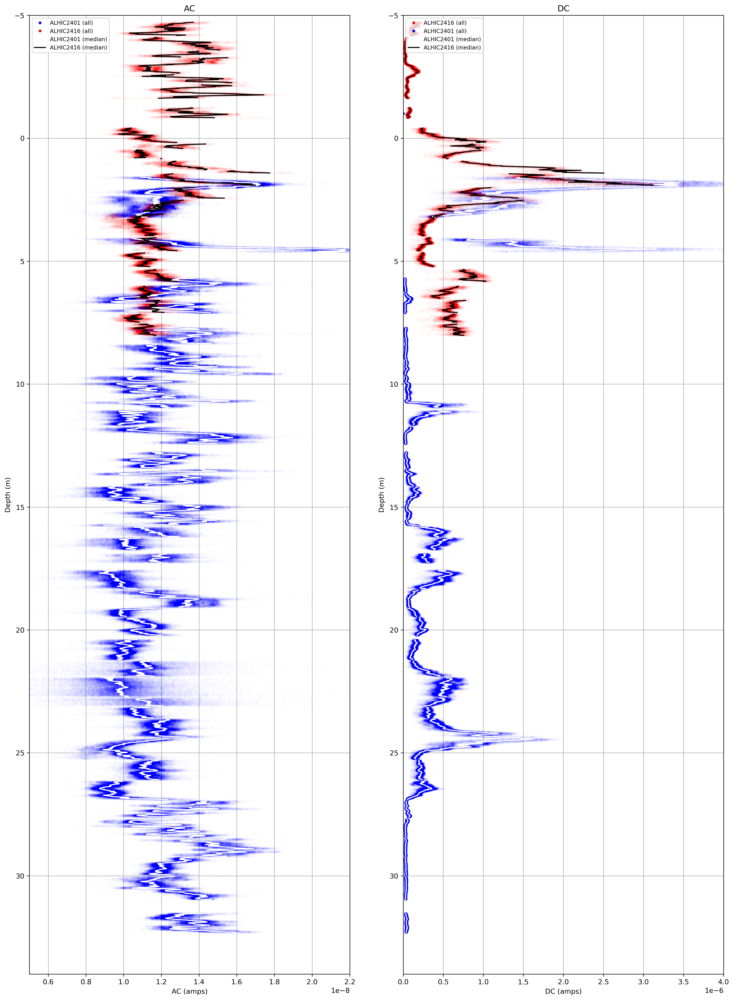

In [8]:
fig, ax = plt.subplots(
    1, 3, figsize=(18, 25), dpi=300,
    gridspec_kw={'width_ratios': [3, .5, 3]}
)

# turn off axis 2
ax[1].axis('off')

#shift = -18
shift = -18.3

# add shift to all 2416 depth lists
depth_alhic2416_AC_shifted = [d+shift for d in depth_alhic2416_AC]
depth_alhic2416_DC_shifted  = [d+shift for d in depth_alhic2416_DC]
AC_d_2416_shifted = [d+shift for d in AC_d_2416]
DC_d_2416_shifted = [d+shift for d in DC_d_2416]


for a in [ax[0],ax[2]]:
    a.set_ylabel('Depth (m)')
    a.set_ylim([34,-5])

# eliminate horizontal space between subplots 0,1 and 3,4
fig.subplots_adjust(wspace=0)

# plot all AC data on left
ax[0].plot(meas_ALHIC2401_AC, depth_alhic2401_AC, '.', alpha=0.002,color='blue')
ax[0].plot(meas_ALHIC2416_AC, depth_alhic2416_AC_shifted , '.', alpha = 0.002, color='red')
ax[0].plot([0, 0], [-1, -1], '.',color='blue', label='ALHIC2401 (all)')
ax[0].plot([0, 0], [-1, -1], '.',color='red', label='ALHIC2416 (all)')

# plot all DC data on right
ax[2].plot(meas_ALHIC2401_DC, depth_alhic2401_DC, '.', alpha=0.002, color='blue')
ax[2].plot(meas_ALHIC2416_DC, depth_alhic2416_DC_shifted, '.', alpha=0.002, color='red')
ax[2].plot([0, 0], [-1, -1], '.',color='red', label='ALHIC2416 (all)')
ax[2].plot([0, 0], [-1, -1], '.',color='blue', label='ALHIC2401 (all)')

# plot AC on left (2401 on ax 0 and 2416 on ax 1)
ax[0].plot(AC_m_2401, AC_d_2401, color='w', label='ALHIC2401 (median)')
ax[0].plot(AC_m_2416, AC_d_2416_shifted , color='k', label='ALHIC2416 (median)')

# plot DC on right (2401 on ax 3 and 2416 on ax 4)
ax[2].plot(DC_m_2401, DC_d_2401, color='w', label='ALHIC2401 (median)')
ax[2].plot(DC_m_2416, DC_d_2416_shifted, color='k', label='ALHIC2416 (median)')

# add subplot titles
ax[0].set_title('AC')
ax[2].set_title('DC')

# put DC on log scale
#ax[2].set_xscale('log')

# add x axis labels
ax[0].set_xlabel('AC (amps)')
ax[2].set_xlabel('DC (amps)')

# add legend
ax[0].legend(loc='upper left', fontsize=8)
ax[2].legend(loc='upper left', fontsize=8)

# add grid
ax[0].grid()
ax[2].grid()

# set x axis limits
ax[0].set_xlim([0.5*10**-8, 2.2*10**-8])
#ax[2].set_xlim([10**-8, 4*10**-6])
ax[2].set_xlim([0, 4*10**-6])

In [9]:
def get_slope(depth, meas, window=0.1, step=0.01):
    """
    Compute local slope of meas vs depth over a running 'window' (m)
    at increments 'step' (m). If any meas in the window is NaN, slope = NaN.
    """
    depth = np.asarray(depth)
    meas  = np.asarray(meas)
    order = np.argsort(depth)
    depth, meas = depth[order], meas[order]

    half = window/2
    d_centers = np.arange(depth.min()+half,
                          depth.max()-half+step/2,
                          step)

    slopes = []
    for c in d_centers:
        mask = (depth >= c-half) & (depth <= c+half)
        if mask.sum() >= 2:
            win = meas[mask]
            if np.isnan(win).any():
                slopes.append(np.nan)
            else:
                p = np.polyfit(depth[mask], win, 1)
                m = win.mean()
                slopes.append(p[0] / m)
        else:
            slopes.append(np.nan)

    return d_centers, slopes

In [ ]:
# compute slopes
d_centers_2401_AC, slopes_AC_2401 = get_slope(AC_d_2401, AC_m_2401, window=0.2, step=0.01)
d_centers_2416_AC, slopes_AC_2416 = get_slope(AC_d_2416, AC_m_2416, window=0.2, step=0.01)

# compute DC slopes
d_centers_2401_DC, slopes_DC_2401 = get_slope(DC_d_2401, DC_m_2401, window=0.2, step=0.01)
d_centers_2416_DC, slopes_DC_2416 = get_slope(DC_d_2416, DC_m_2416, window=0.2, step=0.01)



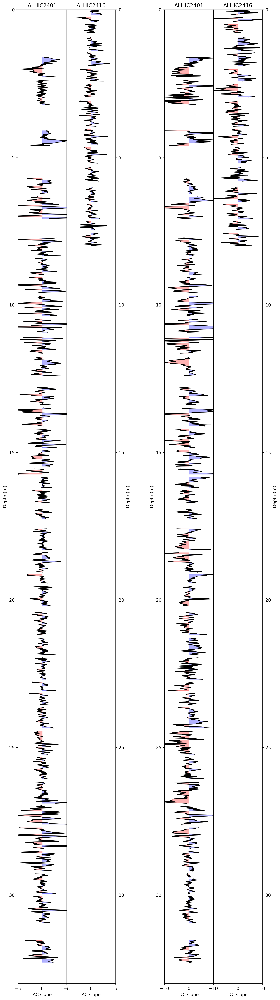

In [17]:
# shift depth for 2416
shift = -18.3
d_centers_2416_AC_shifted = [d+shift for d in d_centers_2416_AC]
d_centers_2416_DC_shifted = [d+shift for d in d_centers_2416_DC]


fig, ax = plt.subplots(1, 5, figsize=(10, 40), dpi=300)

# turn off middle axis
ax[2].axis('off')

# flip right‐side y-axes
for i in (1,4):
    ax[i].yaxis.tick_right()
    ax[i].yaxis.set_label_position("right")

# common y‐labels & limits
for i in (0,1,3,4):
    ax[i].set_ylabel('Depth (m)')
    ax[i].set_ylim([33,0])

fig.subplots_adjust(wspace=0)

# plot AC slopes
ax[0].plot(slopes_AC_2401, d_centers_2401_AC, color='k', label='AC slope')
ax[1].plot(slopes_AC_2416, d_centers_2416_AC_shifted, color='k', label='AC slope')

# shade AC positive/negative
ax[0].fill_betweenx(d_centers_2401_AC, 0, slopes_AC_2401,
                    where=np.array(slopes_AC_2401) >= 0,
                    color='blue', alpha=0.3)
ax[0].fill_betweenx(d_centers_2401_AC, 0, slopes_AC_2401,
                    where=np.array(slopes_AC_2401) <= 0,
                    color='red', alpha=0.3)

ax[1].fill_betweenx(d_centers_2416_AC_shifted, 0, slopes_AC_2416,
                    where=np.array(slopes_AC_2416) >= 0,
                    color='blue', alpha=0.3)
ax[1].fill_betweenx(d_centers_2416_AC_shifted, 0, slopes_AC_2416,
                    where=np.array(slopes_AC_2416) <= 0,
                    color='red', alpha=0.3)

# plot DC slopes
ax[3].plot(slopes_DC_2401, d_centers_2401_DC, color='k', label='DC slope')
ax[4].plot(slopes_DC_2416, d_centers_2416_DC_shifted, color='k', label='DC slope')

# shade DC positive/negative
ax[3].fill_betweenx(d_centers_2401_DC, 0, slopes_DC_2401,
                    where=np.array(slopes_DC_2401) >= 0,
                    color='blue', alpha=0.3)
ax[3].fill_betweenx(d_centers_2401_DC, 0, slopes_DC_2401,
                    where=np.array(slopes_DC_2401) <= 0,
                    color='red', alpha=0.3)

ax[4].fill_betweenx(d_centers_2416_DC_shifted, 0, slopes_DC_2416,
                    where=np.array(slopes_DC_2416) >= 0,
                    color='blue', alpha=0.3)
ax[4].fill_betweenx(d_centers_2416_DC_shifted, 0, slopes_DC_2416,
                    where=np.array(slopes_DC_2416) <= 0,
                    color='red', alpha=0.3)

# titles
ax[0].set_title('ALHIC2401')
ax[1].set_title('ALHIC2416')
ax[3].set_title('ALHIC2401')
ax[4].set_title('ALHIC2416')

# x labels
ax[0].set_xlabel('AC slope')
ax[1].set_xlabel('AC slope')
ax[3].set_xlabel('DC slope')
ax[4].set_xlabel('DC slope')

# keep DC on log if you like (optional)
#ax[3].set_xscale('log')
#ax[4].set_xscale('log')

for a in [ax[0],ax[1]]:
    mag = 5
    a.set_xlim([-mag, mag])

for a in [ax[3],ax[4]]:
    mag = 10
    a.set_xlim([-mag, mag])


Best shift = -20.934 m (RMSE = 1.308e+00)


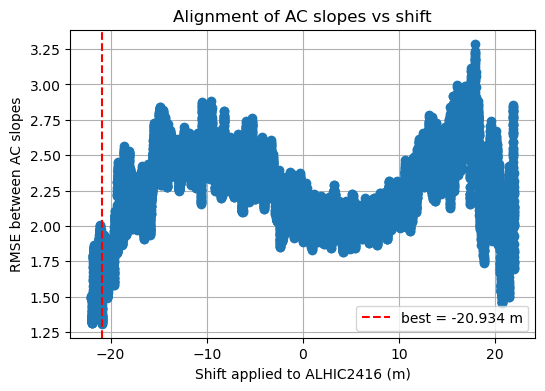

In [15]:
# test shifts to align ALHIC2416 AC slopes to ALHIC2401 AC slopes
#shifts = np.arange(-10, 10.1, 0.1)  # shifts from -10 to +10 m
shifts = np.linspace(-22, 22, 22001)  # shifts from -10 to +10 m
errors = []

# arrays of centers and slopes for convenience
centers2401 = np.array(d_centers_2401_AC)
slopes2401 = np.array(slopes_AC_2401)
centers2416 = np.array(d_centers_2416_AC)
slopes2416 = np.array(slopes_AC_2416)

for s in shifts:
    # shift 2416 centers
    shifted = centers2416 + s
    # interpolate 2416 slopes onto 2401 depth grid
    interp2416 = np.interp(centers2401, shifted, slopes2416,
                           left=np.nan, right=np.nan)
    # compute RMSE where both series are valid
    valid = ~np.isnan(interp2416) & ~np.isnan(slopes2401)
    rmse = np.sqrt(np.mean((interp2416[valid] - slopes2401[valid])**2))
    errors.append(rmse)

# find best shift
best_idx = int(np.nanargmin(errors))
best_shift = shifts[best_idx]
best_rmse = errors[best_idx]
print(f"Best shift = {best_shift} m (RMSE = {best_rmse:.3e})")

# plot RMSE vs shift
plt.figure(figsize=(6,4))
plt.plot(shifts, errors, '-o')
plt.axvline(best_shift, color='red', linestyle='--',
            label=f'best = {best_shift} m')
plt.xlabel('Shift applied to ALHIC2416 (m)')
plt.ylabel('RMSE between AC slopes')
plt.title('Alignment of AC slopes vs shift')
plt.legend()
plt.grid(True)
plt.show()

Best shift (DC) = 21.226 m (RMSE = 2.256e+00)


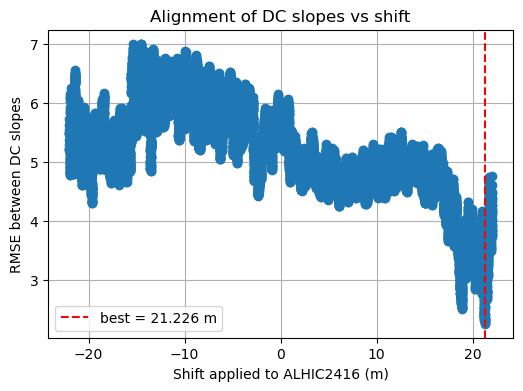

In [16]:
# test shifts to align ALHIC2416 DC slopes to ALHIC2401 DC slopes
shifts = np.linspace(-22, 22, 22001)  # shifts from -10 to +10 m
errors = []

centers2401 = np.array(d_centers_2401_DC)
slopes2401  = np.array(slopes_DC_2401)
centers2416 = np.array(d_centers_2416_DC)
slopes2416  = np.array(slopes_DC_2416)

for s in shifts:
    shifted = centers2416 + s
    interp2416 = np.interp(centers2401, shifted, slopes2416,
                           left=np.nan, right=np.nan)
    valid = ~np.isnan(interp2416) & ~np.isnan(slopes2401)
    rmse = np.sqrt(np.mean((interp2416[valid] - slopes2401[valid])**2))
    errors.append(rmse)

best_idx   = int(np.nanargmin(errors))
best_shift = shifts[best_idx]
best_rmse  = errors[best_idx]
print(f"Best shift (DC) = {best_shift} m (RMSE = {best_rmse:.3e})")

# plot RMSE vs shift for DC
plt.figure(figsize=(6,4))
plt.plot(shifts, errors, '-o')
plt.axvline(best_shift, color='red', linestyle='--',
            label=f'best = {best_shift} m')
plt.xlabel('Shift applied to ALHIC2416 (m)')
plt.ylabel('RMSE between DC slopes')
plt.title('Alignment of DC slopes vs shift')
plt.legend()
plt.grid(True)
plt.show()